<a href="https://colab.research.google.com/github/pranaysawant/Brain-Tumour-Detection-using-MRI/blob/master/Brain_Tumour_Detection_Latest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Brain Tumour Detection

## 1. Bussiness Problem

### 1.1 Description

Source : https://www.kaggle.com/navoneel/brain-mri-images-for-brain-tumor-detection

Download brain-mri-images-for-brain-tumor-detection.zip from Kaggle.

## What is a brain tumor?

A brain tumor is a collection, or mass, of abnormal cells in your brain. Your skull, which encloses your brain, is very rigid. Any growth inside such a restricted space can cause problems. Brain tumors can be cancerous (malignant) or noncancerous (benign). When benign or malignant tumors grow, they can cause the pressure inside your skull to increase. This can cause brain damage, and it can be life-threatening.

Brain tumors are categorized as primary or secondary. A primary brain tumor originates in your brain. Many primary brain tumors are benign. A secondary brain tumor, also known as a metastatic brain tumor, occurs when cancer cells spread to your brain from another organ, such as your lung or breast.


https://www.healthline.com/health/brain-tumor#types


### 1.2 Problem Statement

Classify that patient have "Brain Tumour" or not. Based on Brain MRI images.

## 2. Machine Learning Problem Formulation

## 2.1 Mapping the real-world problem to an ML problem

### 2.1.1 Type of Machine Learning Problem

Basically there are only two class, one those patient have brain tumour and other those don't have brain tumour.
So its simply **Two class classification problem**.

### 2.1.2Performance Metric
- Logloss is good metric.
- Confusion Matrix

## 3. Machine Learing Objectives and Constraints

Objective: Predict the probability of each data-point belonging to each of the nine classes.

Constraints:

* Interpretability
* Class probabilities are needed.
* Penalize the errors in class probabilites => Metric is Log-loss.
* No Latency constraints.

## 4. Data

Source of data is here, https://www.kaggle.com/navoneel/brain-mri-images-for-brain-tumor-detection

In this dataset, there are two type of "Brain MRI" images presents one type of images of patient those suffering from brain tumour and other of those do not have brain tumour. 

## 4.1 Data Overview

The dataset contains 2 folders: **yes** and **no** which contains **253 Brain MRI Images**. The folder **yes contains 155 Brain MRI Images** that are tumorous and the folder **no contains 98 Brain MRI Images** that are non-tumorous.



Patients who having 'Brain Tumour'. There sample MRI images are as follows

(-0.5, 208.5, 211.5, -0.5)

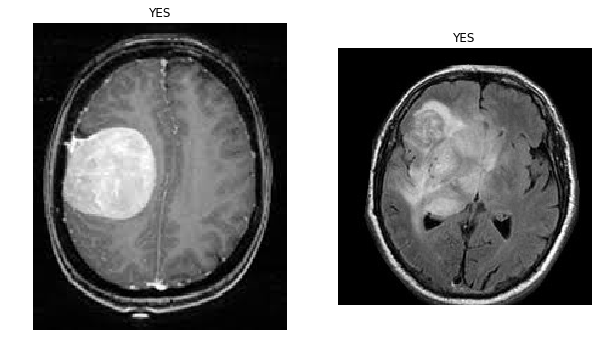

In [0]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,10))
img1 = PIL.Image.open('Y1.jpg')
img2 = PIL.Image.open('Y2.jpg')

ax[0].imshow(img1)
ax[0].set_title('YES')
ax[1].imshow(img2)
ax[1].set_title('YES');

ax[0].axis('off')
ax[1].axis('off')



Patients who do have 'Brain Tumour'. There sample MRI images are as follows

(-0.5, 629.5, 629.5, -0.5)

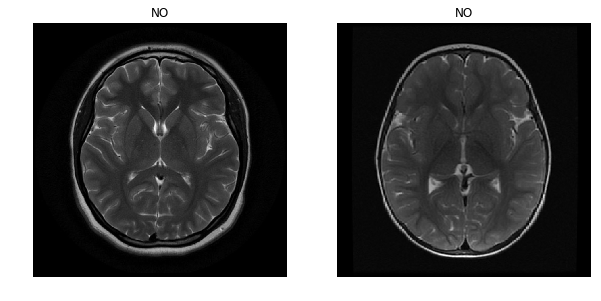

In [0]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,10))
img1 = PIL.Image.open('1 no.jpeg')
img2 = PIL.Image.open('2 no.jpeg')

ax[0].imshow(img1)
ax[0].set_title('NO')
ax[1].imshow(img2)
ax[1].set_title('NO');

ax[0].axis('off')
ax[1].axis('off')



There are 253 Brain MRI Images.
- 155 tumour positive (61.26% ) 
- 98 tumour negative (38.73%)

So Dataset is small and fairly imbalance.

## 4.2 Data Preprocessing

Lets check width and height of each image.

In [0]:
from os import makedirs
from os.path import exists, join


In [2]:
!pip install hyperas==0.4.1

import time
from __future__ import print_function
from hyperopt import Trials, STATUS_OK, tpe
from hyperas import optim
from hyperas.distributions import choice, uniform

import imutils
import cv2
from PIL import Image
import PIL

import os
from os import makedirs
from os.path import exists, join

import pdb
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import shutil
import numpy as np

import keras
from keras.applications.imagenet_utils import preprocess_input
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.applications import vgg16, inception_v3, resnet50, mobilenet

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, ZeroPadding2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K
from keras.models import Model
from keras import layers
from keras.callbacks import EarlyStopping,ModelCheckpoint
from keras.models import load_model


from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.layers import merge, Input

from keras.regularizers import l1,l2,l1_l2

from joblib import load,dump
from sklearn.metrics import accuracy_score, confusion_matrix

Using TensorFlow backend.


In [3]:
### tensor board
import tensorflow as tf
from tensorboard.plugins.hparams import api as hp
from google.protobuf import struct_pb2
from keras.callbacks import TensorBoard

!pip install -q tf-nightly-2.0-preview
# Load the TensorBoard notebook extension
%load_ext tensorboard

     |████████████████████████████████| 95.2MB 412kB/s 
     |████████████████████████████████| 450kB 44.0MB/s 
     |████████████████████████████████| 3.8MB 28.4MB/s 


In [0]:
sess = tf.Session()
K.set_session(sess)

In [5]:
from google.colab import drive
drive.mount('/content/drive')

import os
os.chdir("/content/drive/My Drive/brain_tumour")

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
postImagesDir = "/content/drive/My Drive/Brain Tumour/images/yes/"

# this method print image's width and height
def printImageWithAndHeight(path):
    files = []
    # r=root, d=directories, f = files
    for r, d, f in os.walk(path):
        for file in f:
            if '.jpg' or '.jpeg' in file:
                files.append(os.path.join(r, file))

    for f in files:
        im = Image.open(f)
        width, height = im.size
        print("Width : ",width, " Height : ",height)
        
    return files
    
posImagesList = printImageWithAndHeight(postImagesDir)  

Width :  215  Height :  233
Width :  250  Height :  290
Width :  286  Height :  370
Width :  400  Height :  431
Width :  194  Height :  260
Width :  1059  Height :  1200
Width :  526  Height :  555
Width :  211  Height :  239
Width :  200  Height :  253
Width :  630  Height :  630
Width :  700  Height :  890
Width :  272  Height :  350
Width :  310  Height :  380
Width :  283  Height :  334
Width :  620  Height :  620
Width :  240  Height :  300
Width :  292  Height :  349
Width :  178  Height :  249
Width :  260  Height :  298
Width :  253  Height :  291
Width :  205  Height :  246
Width :  272  Height :  324
Width :  300  Height :  359
Width :  864  Height :  938
Width :  272  Height :  355
Width :  400  Height :  431
Width :  273  Height :  318
Width :  355  Height :  450
Width :  630  Height :  630
Width :  911  Height :  938
Width :  224  Height :  245
Width :  303  Height :  354
Width :  291  Height :  340
Width :  289  Height :  300
Width :  276  Height :  323
Width :  272  Heig

In [0]:
negtImagesDir = "/content/drive/My Drive/Brain Tumour/images/no/"

negImageList = printImageWithAndHeight(negtImagesDir)    

Width :  300  Height :  168
Width :  442  Height :  442
Width :  225  Height :  225
Width :  173  Height :  201
Width :  194  Height :  259
Width :  300  Height :  168
Width :  442  Height :  442
Width :  750  Height :  750
Width :  380  Height :  530
Width :  630  Height :  630
Width :  630  Height :  630
Width :  630  Height :  630
Width :  550  Height :  664
Width :  442  Height :  442
Width :  201  Height :  251
Width :  393  Height :  400
Width :  220  Height :  275
Width :  150  Height :  198
Width :  356  Height :  474
Width :  339  Height :  340
Width :  276  Height :  326
Width :  214  Height :  236
Width :  680  Height :  680
Width :  400  Height :  442
Width :  210  Height :  264
Width :  225  Height :  225
Width :  442  Height :  442
Width :  225  Height :  225
Width :  225  Height :  225
Width :  177  Height :  197
Width :  468  Height :  444
Width :  196  Height :  257
Width :  232  Height :  217
Width :  420  Height :  280
Width :  200  Height :  252
Width :  441  Height

We can clearly see that all images are of different sizes, to work with them we first need to resize all images to same size say (224 * 224) ie width =224 and height 224.

#### Crop the image

We need to normalise a image, we can crop Brain MRI out of images. So best way to crop image is mentioned below.
Using this technique we can find out extreme left, extrem right, extreme top and extreme bottom points. 

https://www.pyimagesearch.com/2016/04/11/finding-extreme-points-in-contours-with-opencv/

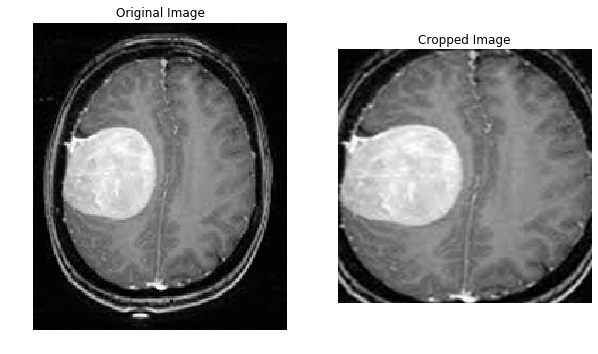

In [0]:
# this method is used to crop the images. In image it consider extreme left, extreme right , extreme top
# and extreme bottom points. Rest image is cropped.

def cropImage(imagePath, demo=False):

        
    # load the image, convert it to grayscale, and blur it slightly
    image = cv2.imread(imagePath)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)

    # threshold the image, then perform a series of erosions +
    # dilations to remove any small regions of noise
    thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
    thresh = cv2.erode(thresh, None, iterations=2)
    thresh = cv2.dilate(thresh, None, iterations=2)

    # find contours in thresholded image, then grab the largest
    # one
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = max(cnts, key=cv2.contourArea)

    # determine the most extreme points along the contour
    extLeft = tuple(c[c[:, :, 0].argmin()][0])
    extRight = tuple(c[c[:, :, 0].argmax()][0])
    extTop = tuple(c[c[:, :, 1].argmin()][0])
    extBot = tuple(c[c[:, :, 1].argmax()][0])
    
    crop_image = image[extTop[1]:extBot[1], extLeft[0]:extRight[0]]  
    crop_image = cv2.resize(crop_image, dsize=(224, 224), interpolation=cv2.INTER_CUBIC)
    
    if demo != True : 
        cv2.imwrite(imagePath,crop_image)
        
    else :
        cv2.imwrite('Y1_demo.jpg',crop_image)
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,10))
        img1 = PIL.Image.open('Y1.jpg')
        img2 = PIL.Image.open('Y1_demo.jpg')

        ax[0].imshow(img1)
        ax[0].set_title('Original Image')
        ax[1].imshow(img2)
        ax[1].set_title('Cropped Image');

        ax[0].axis('off')
        ax[1].axis('off')

        
cropImage('Y1.jpg', True )

In [0]:
# Cropping all images Positive label as well as negative label

for f in posImagesList:
    cropImage(f)
for f in negImageList:
    cropImage(f)

So now we have converted image to 224 * 224 shape.

## 4.3 Train, Validation and Test sets

Now after data preprocessing next step is to divide whole dataset into Train, Validation and Test sets

In [0]:
split_1 = int(0.7 * len(posImagesList))
split_2 = int(0.85 * len(posImagesList))
train_filenames = posImagesList[:split_1]
validate_filenames = posImagesList[split_1:split_2]
test_filenames = posImagesList[split_2:]


n_split_1 = int(0.7 * len(negImageList))
n_split_2 = int(0.85 * len(negImageList))
n_train_filenames = negImageList[:n_split_1]
n_dev_filenames = negImageList[n_split_1:n_split_2]
n_test_filenames = negImageList[n_split_2:]

In [0]:
train_dir = "/content/drive/My Drive/brain_tumour/dataset/train/"
validate_dir = "/content/drive/My Drive/brain_tumour/dataset/validate/"
test_dir =  "/content/drive/My Drive/brain_tumour/dataset/test/"

def split_data(fileList, setType,polarity='no'):
    
    for f in fileList:
        
        if setType == 'train': ##### Train #####
            
            if polarity == 'pos':
                shutil.copy(f,train_dir+'yes' )
            else :
                shutil.copy(f,train_dir+'no' )

        elif setType == 'validate': #### Validate #####
            if polarity == 'pos':
                shutil.copy(f,validate_dir+'yes' )
            else :
                shutil.copy(f,validate_dir+'no' )            
            
        else : ##### Test #######
            if polarity == 'pos':
                shutil.copy(f,test_dir+'yes' )
            else :
                shutil.copy(f,test_dir+'no' )

In [0]:
# split positive class

split_data(train_filenames,'train','pos')
split_data(n_dev_filenames,'validate','pos')
split_data(test_filenames,'test','pos')

In [0]:
# split negative class

split_data(n_train_filenames,'train','neg')
split_data(n_dev_filenames,'validate','neg')
split_data(n_test_filenames,'test','neg')

In [0]:
# https://stackoverflow.com/questions/7762948/how-to-convert-an-rgb-image-to-numpy-array/46604754

def lableling_data(dir_path):
    X = []
    y = []
    i = 0
    
    # for loop is find all files in dir_path
    for path in (sorted(os.listdir(dir_path))):
        if not path.startswith('.'):
            for file in os.listdir(dir_path + path):
                if not file.startswith('.'):
                    img = cv2.imread(dir_path + path + '/' + file) # cv2.imread --> load image
                    X.append(img)
                    y.append(i)
            i += 1
    X = np.array(X)
    y = np.array(y)
    return X, y

In [0]:
X_train, y_train = lableling_data(train_dir)
X_test, y_test = lableling_data(test_dir)
X_val, y_val = lableling_data(validate_dir)

print('Train X--', X_train.shape,'y --', y_train.shape  )
print('Test X--', X_test.shape,'y --', y_test.shape  )
print('Validation X--', X_val.shape,'y --', y_val.shape  )

Train X-- (176, 224, 224, 3) y -- (176,)
Test X-- (39, 224, 224, 3) y -- (39,)
Validation X-- (30, 224, 224, 3) y -- (30,)


In [0]:
# Normalise data and store for future uses on local disk

X_train = X_train.astype('float')
X_train/=255

X_val = X_val.astype('float')
X_val/=255

X_test = X_test.astype('float')
X_test/=255


dump(X_train, 'pkl_files/X_train.pkl')  
dump(y_train, 'pkl_files/y_train.pkl')  
dump(X_val, 'pkl_files/X_val.pkl')  
dump(y_val, 'pkl_files/y_val.pkl')  
dump(X_val, 'pkl_files/X_test.pkl')  
dump(y_test, 'pkl_files/y_test.pkl')  


['pkl_files/y_test.pkl']

In [0]:
print("Total number images in Positive Train set",len([name for name in os.listdir(train_dir+'/yes') if os.path.isfile(os.path.join(train_dir+'/yes', name))])) 
print("Total number images in Positive Validation set",len([name for name in os.listdir(validate_dir+'/yes') if os.path.isfile(os.path.join(validate_dir+'/yes', name))])) 
print("Total number images in Positive Test set",len([name for name in os.listdir(test_dir+'/yes') if os.path.isfile(os.path.join(test_dir+'/yes', name))])) 

print('=='*25)

print("Total number images in Negative Train set",len([name for name in os.listdir(train_dir+'/no') if os.path.isfile(os.path.join(train_dir+'/no', name))])) 
print("Total number images in Negative Validation set",len([name for name in os.listdir(validate_dir+'/no') if os.path.isfile(os.path.join(validate_dir+'/no', name))])) 
print("Total number images in Negative Test set",len([name for name in os.listdir(test_dir+'/no') if os.path.isfile(os.path.join(test_dir+'/no', name))])) 


Total number images in Positive Train set 108
Total number images in Positive Validation set 15
Total number images in Positive Test set 24
Total number images in Negative Train set 68
Total number images in Negative Validation set 15
Total number images in Negative Test set 15


We can notice that available dataset is small, so we can do data augmentation

## 4.4 Data Augmentation

In [0]:
# https://machinelearningmastery.com/how-to-configure-image-data-augmentation-when-training-deep-learning-neural-networks/
## https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html


datagen = ImageDataGenerator()

datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        rescale=1./255,
        shear_range=0.1,
        zoom_range=0.1,
        brightness_range=[0.1, 1.5],
        horizontal_flip=True,
        vertical_flip=True,
        fill_mode='nearest')

cropImage('data_aug/1 no.jpeg' )

img = load_img('data_aug/1 no.jpeg')  # this is a PIL image
x = img_to_array(img)  # this is a Numpy array with shape (3, 150, 150)
x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 150, 150)

# the .flow() command below generates batches of randomly transformed images
# and saves the results to the `preview/` directory
i = 0
for batch in datagen.flow(x, batch_size=1,
                          save_to_dir='data_aug/preview', save_prefix='no', save_format='jpeg'):
    i += 1
    if i > 20:
        break  # otherwise the generator would loop indefinitely

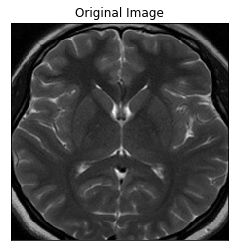

===== IMAGE AUGMENTATION ======= 


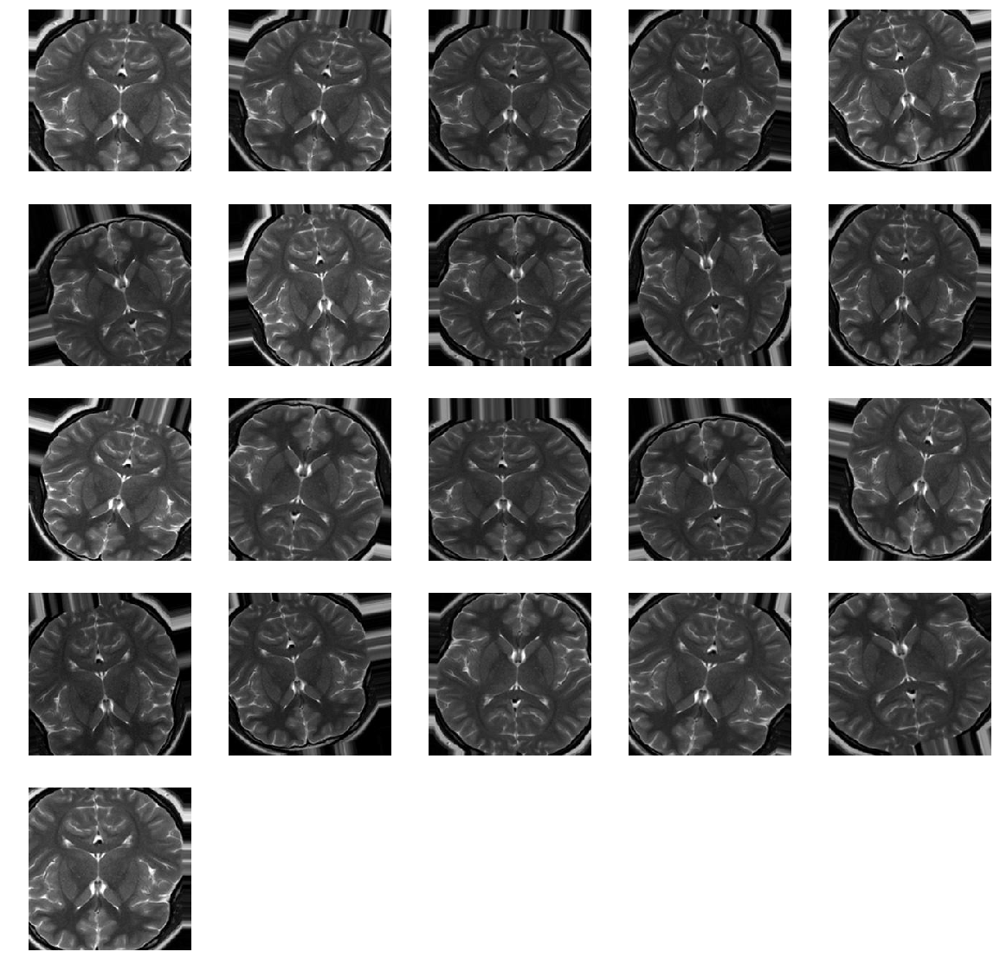

In [0]:
og_img = cv2.cv2.imread('data_aug/1 no.jpeg')
og_img = cv2.cvtColor(og_img, cv2.COLOR_BGR2RGB)
plt.imshow(og_img)
plt.xticks([])
plt.yticks([])
plt.title('Original Image')
plt.show()

aug_images = []
for path in (sorted(os.listdir('data_aug/preview'))):
    if not path.startswith('.'):
        img = cv2.imread('data_aug/preview/'+path) # cv2.imread --> load image
        aug_images.append(img)
        
print('===== IMAGE AUGMENTATION ======= ')

plt.figure(figsize=(20,20))
columns = 5
for i, image in enumerate(aug_images):
    plt.subplot(len(aug_images) / columns + 1, columns, i + 1)
    plt.axis('off')
    plt.imshow(image)

In [6]:
train_dir = "/content/drive/My Drive/brain_tumour/dataset/train/"
validate_dir = "/content/drive/My Drive/brain_tumour/dataset/validate/"
test_dir =  "/content/drive/My Drive/brain_tumour/dataset/test/"

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    brightness_range=[0.5, 1.5],
    horizontal_flip=True,
    vertical_flip=True,
    preprocessing_function=preprocess_input
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    color_mode='rgb',
    target_size=(224,224),
    batch_size=32,
    class_mode='binary'
)


validation_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=5,
    width_shift_range=0.01,
    height_shift_range=0.01,
    shear_range=0.01,
    brightness_range=[0.5, 1.5],
    horizontal_flip=True,
    vertical_flip=True,
    preprocessing_function=preprocess_input
)

validation_generator = validation_datagen.flow_from_directory(
    validate_dir,
    color_mode='rgb',
    target_size=(224,224),
    batch_size=16,
    class_mode='binary')

Found 176 images belonging to 2 classes.
Found 38 images belonging to 2 classes.


## 5. Model Evalution

In [0]:
import pandas as pd
import seaborn as sns


def plotErrorGraph(history, ep=30):

    # Making the plot larger
    plt.figure(figsize=(12, 8))

    loss = history.history['loss']                          # Loss on the training data
    val_loss = history.history['val_loss']                  # Loss on the validation data
    epochs = range(1, ep+1)

    plt.plot(epochs, loss, 'ro-', label='Training Loss')
    plt.plot(epochs, val_loss, 'go-', label = 'Validation Loss')
    plt.legend()
    
    
# https://www.geeksforgeeks.org/confusion-matrix-machine-learning/    
def plotConfusionMatrix(y_test,pred):

    pred = [1 if x>0.5 else 0 for x in pred]

    # calculate confusion matrix
    cm =  confusion_matrix(y_test,pred)
    class_label = ['negative', 'positive']
    df_conf_matrix = pd.DataFrame(cm, index=class_label, columns=class_label)
    # heatmap --> Plot rectangular data as a color-encoded matrix. 
    sns.heatmap(df_conf_matrix, annot=True, fmt='d')
    # give title to graph
    plt.title("Confusion Matrix")
    # mention axis label
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    # show the plot
    plt.show()


####################################
## https://datascience.stackexchange.com/questions/45165/how-to-get-accuracy-f1-precision-and-recall-for-a-keras-model

def recall_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

def precision_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))


## 6. Model

In [0]:
def data():
    X_train = load('pkl_files/X_train.pkl')
    y_train = load('pkl_files/y_train.pkl')
    X_val = load('pkl_files/X_val.pkl')
    y_val = load('pkl_files/y_val.pkl')
    X_test = load('pkl_files/X_test.pkl')
    y_test = load('pkl_files/y_test.pkl')

    return X_train, y_train, X_val, y_val, X_test,y_test

X_train, y_train, X_val, y_val, X_test,y_test  = data()

In [0]:
# Initializing parameters

nb_train_samples = 1000
nb_validation_samples = 400
epochs = 30
batch_size = 16

img_height = img_width =224

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)

In [0]:
input_shape

(224, 224, 3)

In [0]:
# # Initiliazing the sequential model

model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(1))
model.add(Activation('sigmoid'))
model.summary()






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 222, 222, 32)      896       
_________________________________________________________________
activation_1 (Activation)    (None, 222, 222, 32)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 111, 111, 32)      0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 394272)            0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                25233472  
_________________________________________________________________
activation_2 (Activation)    (None, 64)                0         


In [0]:
model.compile(loss='binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

history = model.fit_generator(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size)



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Epoch 1/30
62/62 [==============================] - 108s 2s/step - loss: 5.2134 - acc: 0.5872 - val_loss: 1.0742 - val_acc: 0.5106
Epoch 2/30
62/62 [==============================] - 35s 558ms/step - loss: 0.6595 - acc: 0.6355 - val_loss: 0.9751 - val_acc: 0.5053
Epoch 3/30
62/62 [==============================] - 36s 583ms/step - loss: 0.6277 - acc: 0.6729 - val_loss: 0.7827 - val_acc: 0.4947
Epoch 4/30
62/62 [==============================] - 35s 556ms/step - loss: 0.6005 - acc: 0.7026 - val_loss: 0.8209 - val_acc: 0.4866
Epoch 5/30
62/62 [==============================] - 34s 548ms/step - loss: 0.5820 - acc: 0.7359 - val_loss: 0.9220 - val_acc: 0.4840
Epoch 6/30
62/62 [==============================] - 36s 577ms/step - loss: 0.5772 - acc: 0.7188 - val_loss: 0.8804 - val_acc: 0.4920
Epoch 7/30
62/62 [==============================] - 33s 535ms/step - loss: 0.5755 - acc: 0.7324 - val_loss: 

Firstly we just try to find basemodel. But seems that val_acc is 0.4866,which is very low. We can try different models.

In [0]:
# # Initiliazing the sequential model

model = Sequential()
model.add(Conv2D(16, (5, 5), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Dropout(0.3))
model.add(Conv2D(64, (5, 5)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(128))
model.add(Activation('relu'))
model.add(Dropout(0.4))

model.add(Dense(1))
model.add(Activation('sigmoid'))
model.summary()

model.compile(loss='binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

history = model.fit_generator(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 220, 220, 16)      1216      
_________________________________________________________________
activation_4 (Activation)    (None, 220, 220, 16)      0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 110, 110, 16)      0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 110, 110, 16)      0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 106, 106, 64)      25664     
_________________________________________________________________
activation_5 (Activation)    (None, 106, 106, 64)      0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 53, 53, 64)       

We can see that model is not improving much. Yet we will try some different architecture.

In [0]:
# Initiliazing the sequential model

model = Sequential()
model.add(Conv2D(16, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(1))
model.add(Activation('sigmoid'))
model.summary()

model.compile(loss='binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

history = model.fit_generator(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 222, 222, 16)      448       
_________________________________________________________________
activation_8 (Activation)    (None, 222, 222, 16)      0         
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 111, 111, 16)      0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 197136)            0         
_________________________________________________________________
dense_5 (Dense)              (None, 64)                12616768  
_________________________________________________________________
activation_9 (Activation)    (None, 64)                0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 64)               

Again outcome is not upto the mark, So lets TUNE the model. We can do hyper parameter tuning using HYPERAS.

## 6.2 Hyper parameter Tuning using Hyperas

In [0]:
# https://towardsdatascience.com/a-guide-to-an-efficient-way-to-build-neural-network-architectures-part-i-hyper-parameter-8129009f131b

from hyperopt import Trials, STATUS_OK, tpe
from hyperas import optim
from hyperas.distributions import choice, uniform

def model(X_train, y_train, X_val, y_val):
    
    model = Sequential()
    model.add(Dense({{choice([128, 256, 512, 1024])}}, input_shape=(224,224,3)))
    model.add(Activation({{choice(['relu', 'sigmoid'])}}))
    model.add(Dropout({{uniform(0, 1)}}))
    model.add(Dense({{choice([128, 256, 512, 1024])}}))
    model.add(Activation({{choice(['relu', 'sigmoid'])}}))
    model.add(Dropout({{uniform(0, 1)}}))
    model.add(MaxPooling1D(pool_size={{choice([2,3,5])}}))

    
    if conditional({{choice(['two', 'three'])}}) == 'three':
        model.add(Dense({{choice([128, 256, 512, 1024])}}))
        model.add(Activation({{choice(['relu', 'sigmoid'])}}))
        model.add(Dropout({{uniform(0, 1)}}))
        
    model.add(Dense(1))
    model.add(Activation('softmax'))
    adam = keras.optimizers.Adam(lr={{choice([10**-3, 10**-2, 10**-1])}})
    rmsprop = keras.optimizers.RMSprop(lr={{choice([10**-3, 10**-2, 10**-1])}})
    sgd = keras.optimizers.SGD(lr={{choice([10**-3, 10**-2, 10**-1])}})
   
    choiceval = {{choice(['adam', 'sgd', 'rmsprop'])}}
    if choiceval == 'adam':
        optim = adam
    elif choiceval == 'rmsprop':
        optim = rmsprop
    else:
        optim = sgd
        
    model.compile(loss='binary_crossentropy', metrics=['accuracy'],optimizer=optim)
    model.fit(X_train, y_train,
              batch_size={{choice([16,32])}},
              nb_epoch={{choice([30,40])}},
              verbose=2,
              validation_data=(X_val, y_val))
    score, acc = model.evaluate(X_val, y_val, verbose=1)
    print('Test accuracy:', acc)
    return {'loss': -acc, 'status': STATUS_OK, 'model': model}

def data():
    X_train = load('pkl_files/X_train.pkl')
    y_train = load('pkl_files/y_train.pkl')
    X_val = load('pkl_files/X_val.pkl')
    y_val = load('pkl_files/y_val.pkl')
    X_test = load('pkl_files/X_test.pkl')
    y_test = load('pkl_files/y_test.pkl')

    return X_train, y_train, X_val, y_val, X_test,y_test


In [0]:

def data():
    X_train = load('pkl_files/X_train.pkl')
    y_train = load('pkl_files/y_train.pkl')
    X_val = load('pkl_files/X_val.pkl')
    y_val = load('pkl_files/y_val.pkl')
    X_test = load('pkl_files/X_test.pkl')
    y_test = load('pkl_files/y_test.pkl')

    return X_train, y_train, X_val, y_val, X_test,y_test



def model(X_train, y_train, X_val, y_val):
   

    nb_train_samples = 1000
    nb_validation_samples = 400
 

    img_height = img_width =224

    if K.image_data_format() == 'channels_first':
        input_shape = (3, img_width, img_height)
    else:
        input_shape = (img_width, img_height, 3)




    model = Sequential()
    model.add(Conv2D(filters={{choice([64,128,256])}}, kernel_size={{choice([3,5,7])}}, activation='relu',
       input_shape=input_shape))

    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size={{choice([2,3,5])}}))

    model.add(Dropout({{uniform(0, 1)}}))
    model.add(Conv2D(filters={{choice([16,24,32])}}, kernel_size={{choice([3,5,7])}}, activation='relu',
    kernel_regularizer=l2({{uniform(0,3)}})))

    model.add(MaxPooling2D(pool_size={{choice([2,3,5])}}))

    model.add(Flatten())
    model.add(Dense({{choice([100,150,256])}}, activation='relu'))
    model.add(Dropout({{uniform(0, 1)}}))

    model.add(Dense(1))
    model.add(Activation('sigmoid'))
    model.summary()



    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    model.fit(X_train, y_train,
              batch_size={{choice([16,32])}},
              nb_epoch={{choice([50,60])}},
              verbose=5,
              validation_data=(X_val, y_val))
    score, acc = model.evaluate(X_val, y_val, verbose=1)
    
    print('Test accuracy:', score)
    return {'loss': -acc, 'status': STATUS_OK, 'model': model} 


In [0]:
trials = Trials()
X_train, y_train, X_val, y_val, X_test,y_test  = data()

best_run, best_model, space = optim.minimize(model=model,
                                      data=data,
                                      algo=tpe.suggest,
                                      max_evals=100,
                                      trials=trials,notebook_name = 'Brain_Tumour_Detection',
                                      return_space = True)

print("Evalutation of best performing model:")
print(best_run)
print(best_model.evaluate(X_test, y_test))
dump(best_model, 'Hyperas_best_model1.pkl')  



We got below result after tunig.

{'Dense': 1, 
'Dense_1': 0, 

'Dropout': 0.3187008277801444, 
'Dropout_1': 1, 
'Dropout_2': 0.3524243394561949, 
'Dropout_3': 0.2969008159736151, 
'add': 1, 
'batch_size': 1, 
'choiceval': 1, 
'filters': 3, 
'filters_1': 0, 
'filters_2': 2, 

'kernel_size': 0, 
'kernel_size_1': 2, 
'kernel_size_2': 1, 

'l2': 2.4488452291811686, 
'lr': 0.0014357190981773532, 
'lr_1': 0.0025620875786798248, 

'nb_epoch': 3, 

'pool_size': 2, 
'pool_size_1': 2, 
'pool_size_2': 0}

Lets build a model on top of this params

## 6.3 Train With Best Parameters

In [0]:
input_shape = (224,224,3)
X_train, y_train, X_val, y_val, X_test,y_test  = data()

## HYPERTUNE CODE COPY
# # Initiliazing the sequential model

model = Sequential()
model.add(Conv2D(128, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(5, 5)))
model.add(Dropout(0.3))


model.add(Conv2D(16, (7, 7)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(5, 5)))
model.add(Dropout(0.35))

model.add(Conv2D(128, (5, 5)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.3))


model.add(Flatten())
model.add(Dense(256))
model.add(Dropout(0.4))
model.add(Dense(64))

model.add(Dense(1))
model.add(Activation('sigmoid'))
model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_11 (Conv2D)           (None, 222, 222, 128)     3584      
_________________________________________________________________
activation_14 (Activation)   (None, 222, 222, 128)     0         
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 44, 44, 128)       0         
_________________________________________________________________
dropout_14 (Dropout)         (None, 44, 44, 128)       0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 38, 38, 16)        100368    
_________________________________________________________________
activation_15 (Activation)   (None, 38, 38, 16)        0         
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 7, 7, 16)         

In [0]:
model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])



# Training the model
history = model.fit(X_train,
          y_train,
          batch_size=32,
          validation_data=(X_val, y_val),
          epochs=60)

Train on 176 samples, validate on 38 samples
Epoch 1/60
176/176 [==============================] - 3s 15ms/step - loss: 0.6695 - acc: 0.6023 - val_loss: 0.6697 - val_acc: 0.6053
Epoch 2/60
176/176 [==============================] - 1s 5ms/step - loss: 0.6707 - acc: 0.6023 - val_loss: 0.6643 - val_acc: 0.6053
Epoch 3/60
176/176 [==============================] - 1s 6ms/step - loss: 0.6823 - acc: 0.6193 - val_loss: 0.6778 - val_acc: 0.6053
Epoch 4/60
176/176 [==============================] - 1s 5ms/step - loss: 0.6834 - acc: 0.6023 - val_loss: 0.6842 - val_acc: 0.6053
Epoch 5/60
176/176 [==============================] - 1s 5ms/step - loss: 0.6773 - acc: 0.6136 - val_loss: 0.6770 - val_acc: 0.6053
Epoch 6/60
176/176 [==============================] - 1s 5ms/step - loss: 0.6694 - acc: 0.6136 - val_loss: 0.6723 - val_acc: 0.6053
Epoch 7/60
176/176 [==============================] - 1s 6ms/step - loss: 0.6670 - acc: 0.6136 - val_loss: 0.6727 - val_acc: 0.6053
Epoch 8/60
176/176 [==========

39/39 [==============================] - 0s 6ms/step
Training loss: 
[INFO] loss=0.4784, accuracy: 79.4872%


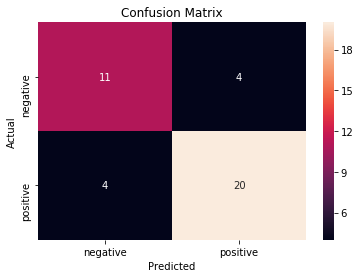

39/39 [==============================] - 0s 3ms/step


[0.4783984021498607, 0.7948717948717948]

In [0]:
(loss, accuracy) = model.evaluate(X_test, y_test, batch_size=10, verbose=1)

print('Training loss: ')
print("[INFO] loss={:.4f}, accuracy: {:.4f}%".format(loss,accuracy * 100))

pred = model.predict(X_test)
plotConfusionMatrix(y_test,pred)

score = model.evaluate(X_test, y_test)
score

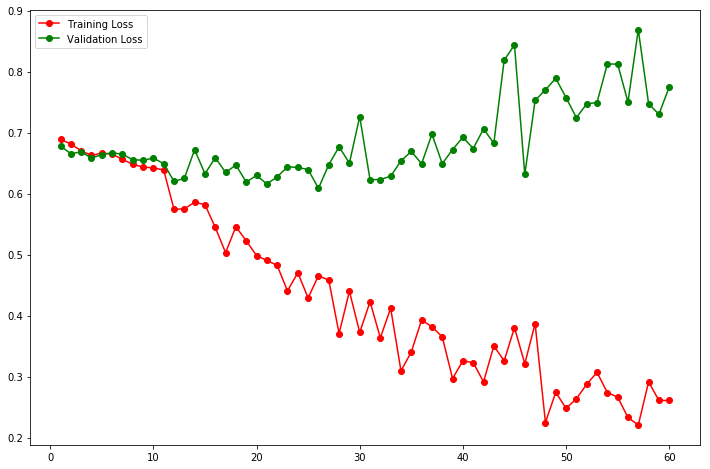

In [0]:
plotErrorGraph(history,60)

So we see that model is slightly overfitting, But remember that we have small set of data, so slightly overfitting is expected. Just notice Confusion Matrix. Its good but can we improved it?

In [0]:
from keras.layers.normalization import BatchNormalization


input_shape = (224,224,3)
X_train, y_train, X_val, y_val, X_test,y_test  = data()

## HYPERTUNE CODE COPY
# # Initiliazing the sequential model

model = Sequential()
model.add(Conv2D(128, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(5, 5)))
model.add(Dropout(0.3))


model.add(Conv2D(8, (7, 7)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(5, 5)))
model.add(Dropout(0.35))

model.add(Conv2D(64, (5, 5)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.3))


model.add(Flatten())
model.add(Dense(256))
model.add(Dropout(0.4))
model.add(Dense(64))

model.add(Dense(1))
model.add(Activation('sigmoid'))
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 222, 222, 128)     3584      
_________________________________________________________________
activation_10 (Activation)   (None, 222, 222, 128)     0         
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 44, 44, 128)       0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 44, 44, 128)       0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 38, 38, 8)         50184     
_________________________________________________________________
activation_11 (Activation)   (None, 38, 38, 8)         0         
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 7, 7, 8)          

In [0]:
model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Training the model
history = model.fit(X_train,
          y_train,
          batch_size=16,
          validation_data=(X_val, y_val),
          epochs=30)
loss = history.history['loss']                          # Loss on the training data
val_loss = history.history['val_loss']                  # Loss on the validation data

acc = history.history['acc']
val_acc = history.history['val_acc']


print( "Traning Accurcy:  ",acc )
print( "Validation Accuracy ",val_acc)

Train on 176 samples, validate on 38 samples
Epoch 1/30
176/176 [==============================] - 2s 13ms/step - loss: 0.4652 - acc: 0.7898 - val_loss: 0.7167 - val_acc: 0.5789
Epoch 2/30
176/176 [==============================] - 1s 6ms/step - loss: 0.4454 - acc: 0.7841 - val_loss: 0.5960 - val_acc: 0.7632
Epoch 3/30
176/176 [==============================] - 1s 6ms/step - loss: 0.3678 - acc: 0.8523 - val_loss: 0.5961 - val_acc: 0.7632
Epoch 4/30
176/176 [==============================] - 1s 6ms/step - loss: 0.3568 - acc: 0.8352 - val_loss: 0.5636 - val_acc: 0.7368
Epoch 5/30
176/176 [==============================] - 1s 5ms/step - loss: 0.3341 - acc: 0.8636 - val_loss: 0.6358 - val_acc: 0.7632
Epoch 6/30
176/176 [==============================] - 1s 6ms/step - loss: 0.3399 - acc: 0.8580 - val_loss: 0.5729 - val_acc: 0.7105
Epoch 7/30
176/176 [==============================] - 1s 6ms/step - loss: 0.3147 - acc: 0.8864 - val_loss: 0.6131 - val_acc: 0.7105
Epoch 8/30
176/176 [==========

39/39 [==============================] - 0s 3ms/step
Training loss: 
[INFO] loss=0.3956, accuracy: 84.6154%


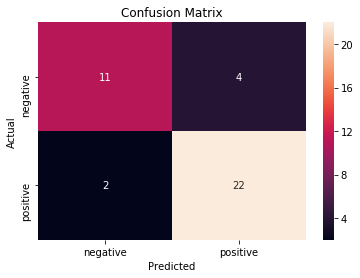

39/39 [==============================] - 0s 3ms/step


[0.39563113374587816, 0.8461538476821704]

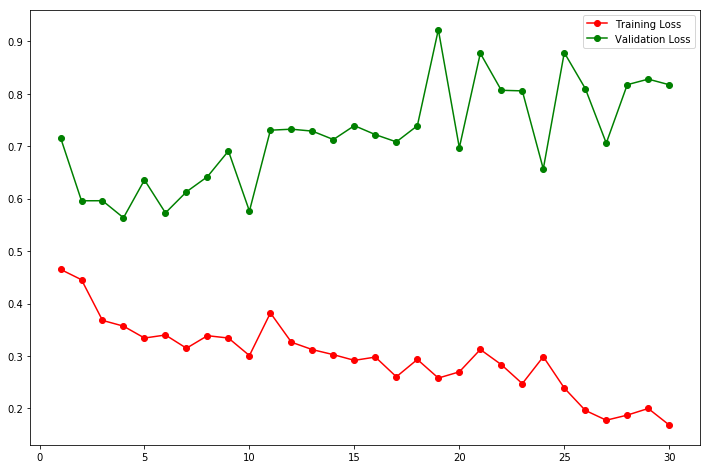

In [0]:
(loss, accuracy) = model.evaluate(X_test, y_test, batch_size=10, verbose=1)

print('Training loss: ')
print("[INFO] loss={:.4f}, accuracy: {:.4f}%".format(loss,accuracy * 100))

pred = model.predict(X_test)
plotConfusionMatrix(y_test,pred)

plotErrorGraph(history,30)

score = model.evaluate(X_test, y_test)
score


- Again, model is slightly overfitting, But accuracy is improved.
- Confusion Matrix also improved.

Looking for more improvement. can we experiment a bit.

In [0]:
input_shape = (224,224,3)
X_train, y_train, X_val, y_val, X_test,y_test  = data()

## HYPERTUNE CODE COPY
# # Initiliazing the sequential model

model = Sequential()
model.add(Conv2D(128, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(5, 5)))
model.add(Dropout(0.3))


model.add(Conv2D(8, (7, 7)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(5, 5)))
model.add(Dropout(0.35))

model.add(Conv2D(32, (5, 5)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.3))


model.add(Flatten())
model.add(Dense(256))
model.add(Dropout(0.4))
model.add(Dense(32))

model.add(Dense(1))
model.add(Activation('sigmoid'))
model.summary()

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_28 (Conv2D)           (None, 222, 222, 128)     3584      
_________________________________________________________________
activation_37 (Activation)   (None, 222, 222, 128)     0         
_________________________________________________________________
max_pooling2d_28 (MaxPooling (None, 44, 44, 128)       0         
_________________________________________________________________
dropout_42 (Dropout)         (None, 44, 44, 128)       0         
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 38, 38, 8)         50184     
_________________________________________________________________
activation_38 (Activation)   (None, 38, 38, 8)         0         
_________________________________________________________________
max_pooling2d_29 (MaxPooling (None, 7, 7, 8)         

In [0]:
model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Training the model
history = model.fit(X_train,
          y_train,
          batch_size=16,
          validation_data=(X_val, y_val),
          epochs=50)


Train on 176 samples, validate on 38 samples
Epoch 1/50
176/176 [==============================] - 4s 20ms/step - loss: 0.7008 - acc: 0.6080 - val_loss: 0.6843 - val_acc: 0.6053
Epoch 2/50
176/176 [==============================] - 1s 4ms/step - loss: 0.6827 - acc: 0.5909 - val_loss: 0.6826 - val_acc: 0.6053
Epoch 3/50
176/176 [==============================] - 1s 4ms/step - loss: 0.6771 - acc: 0.6136 - val_loss: 0.6697 - val_acc: 0.6053
Epoch 4/50
176/176 [==============================] - 1s 4ms/step - loss: 0.6720 - acc: 0.6136 - val_loss: 0.6642 - val_acc: 0.6053
Epoch 5/50
176/176 [==============================] - 1s 4ms/step - loss: 0.6673 - acc: 0.6136 - val_loss: 0.6737 - val_acc: 0.6053
Epoch 6/50
176/176 [==============================] - 1s 4ms/step - loss: 0.6669 - acc: 0.6136 - val_loss: 0.6680 - val_acc: 0.6053
Epoch 7/50
176/176 [==============================] - 1s 4ms/step - loss: 0.6663 - acc: 0.6136 - val_loss: 0.6682 - val_acc: 0.6053
Epoch 8/50
176/176 [==========

39/39 [==============================] - 0s 2ms/step
Training loss: 
[INFO] loss=0.3543, accuracy: 82.0513%


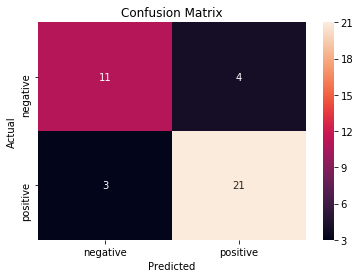

39/39 [==============================] - 0s 2ms/step


[0.3543171729796972, 0.8205128205128205]

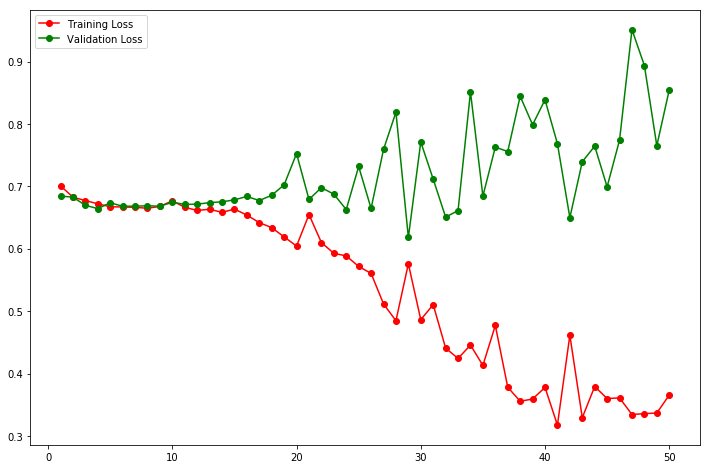

In [0]:
(loss, accuracy) = model.evaluate(X_test, y_test, batch_size=10, verbose=1)
print('Training loss: ')
print("[INFO] loss={:.4f}, accuracy: {:.4f}%".format(loss,accuracy * 100))

pred = model.predict(X_test)
plotConfusionMatrix(y_test,pred)

plotErrorGraph(history,50)

score = model.evaluate(X_test, y_test)
score


- Again, model is slightly overfitting, But accuracy closer to previous model.
- Confusion Matrix also similar to previos model.

Lets try slightly different architecture.

In [0]:
input_shape = (224,224,3)
X_train, y_train, X_val, y_val, X_test,y_test  = data()

## HYPERTUNE CODE COPY
# # Initiliazing the sequential model

model = Sequential()
model.add(Conv2D(128, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(5, 5)))
model.add(Dropout(0.3))


model.add(Conv2D(8, (7, 7)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(5, 5)))
model.add(Dropout(0.35))

model.add(Conv2D(48, (5, 5)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.3))


model.add(Flatten())
model.add(Dense(256))
model.add(Dropout(0.4))
model.add(Dense(64))

model.add(Dense(1))
model.add(Activation('sigmoid'))
model.summary()






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 222, 222, 128)     3584      
_________________________________________________________________
activation_1 (Activation)    (None, 222, 222, 128)     0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 44, 44, 128)       0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 44, 44, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 38, 38, 8)         50184     
_________________________________________________________________
activation_2 (Activation)    (None, 38, 38, 8)         0         


In [0]:
model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Training the model
history = model.fit(X_train,
          y_train,
          batch_size=16,
          validation_data=(X_val, y_val),
          epochs=30)



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 176 samples, validate on 38 samples
Epoch 1/30
176/176 [==============================] - 9s 49ms/step - loss: 0.6852 - acc: 0.5795 - val_loss: 0.6891 - val_acc: 0.6053
Epoch 2/30
176/176 [==============================] - 1s 4ms/step - loss: 0.6766 - acc: 0.5909 - val_loss: 0.6725 - val_acc: 0.6053
Epoch 3/30
176/176 [==============================] - 1s 4ms/step - loss: 0.6707 - acc: 0.6136 - val_loss: 0.6684 - val_acc: 0.6053
Epoch 4/30
176/176 [==============================] - 1s 4ms/step - loss: 0.6671 - acc: 0.6136 - val_loss: 0.6695 - val_acc: 0.6053
Epoch 5/30
176/176 [==============================] - 1s 4ms/step - loss: 0.6631 - acc: 0.6136 - val_loss: 0.6758 - val_acc: 0.6053
Epoch 6/30
176/176 [==============================] - 1s 4ms/step - loss: 0.6805 - acc: 0.6136 - val_loss: 0.6711 - val_acc: 0.6053
Epoch 7/30
176/176 [==============================] - 1s 4ms/step 

39/39 [==============================] - 0s 2ms/step
Training loss: 
[INFO] loss=0.3984, accuracy: 84.6154%


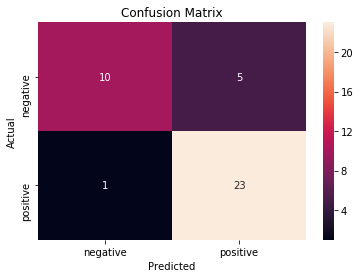

39/39 [==============================] - 0s 2ms/step


[0.39840819514714754, 0.8461538476821704]

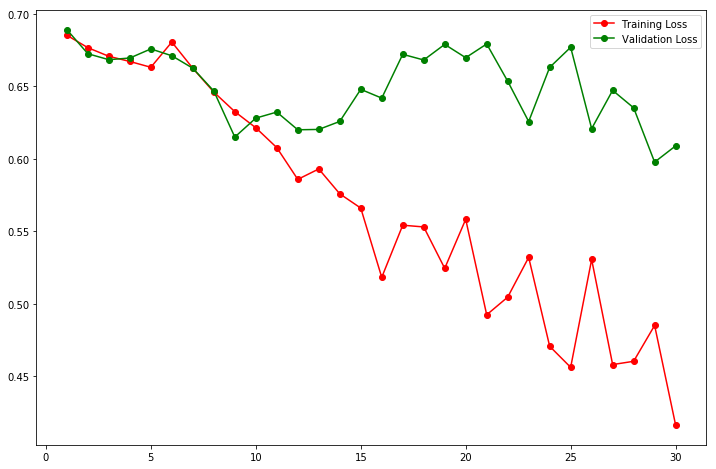

In [0]:
(loss, accuracy) = model.evaluate(X_test, y_test, batch_size=10, verbose=1)
print('Training loss: ')
print("[INFO] loss={:.4f}, accuracy: {:.4f}%".format(loss,accuracy * 100))

pred = model.predict(X_test)
plotConfusionMatrix(y_test,pred)

plotErrorGraph(history,30)

score = model.evaluate(X_test, y_test)
score


We can observe from last few model, accuracy is not improving much. Its good but can we improve more

Here let's experiment with VGG16 model.

# VGG16

### Include top = True

In [0]:
# from vgg16 import VGG16
# import keras
# from keras.applications import vgg16, inception_v3, resnet50, mobilenet


#Training the classifier alone
image_input = Input(shape=(224, 224, 3))

#Load the VGG model
vgg_model = vgg16.VGG16(input_tensor=image_input, include_top=True,weights='imagenet')
vgg_model.summary()

553467904/553467096 [==============================] - 16s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
___________________________________________________________

In [0]:
last_layer = vgg_model.get_layer('fc2').output
out = Dense(1, activation='softmax', name='output')(last_layer)
custom_vgg_model = Model(image_input, out)
custom_vgg_model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [0]:
## As we decided to user whole network,except last layer, we will freeze model upto last last layer.

for layer in custom_vgg_model.layers[:-1]:  ## freeze model upto last layer indicating -1
	layer.trainable = False

custom_vgg_model.layers[3].trainable

False

In [0]:
# Compile model
custom_vgg_model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

In [0]:
history = custom_vgg_model.fit_generator(
    train_generator,
    epochs=30,
    validation_data=validation_generator)

(loss, accuracy) = custom_vgg_model.evaluate(X_test, y_test, batch_size=10, verbose=1)


print('Training loss: ')
print("[INFO] loss={:.4f}, accuracy: {:.4f}%".format(loss,accuracy * 100))

Epoch 1/30
6/6 [==============================] - 91s 15s/step - loss: 5.9331 - acc: 0.6278 - val_loss: 6.2930 - val_acc: 0.6053
Epoch 2/30
6/6 [==============================] - 2s 275ms/step - loss: 6.1466 - acc: 0.6144 - val_loss: 6.2930 - val_acc: 0.6053
Epoch 3/30
6/6 [==============================] - 3s 457ms/step - loss: 6.1466 - acc: 0.6144 - val_loss: 6.2930 - val_acc: 0.6053
Epoch 4/30
6/6 [==============================] - 3s 454ms/step - loss: 6.0754 - acc: 0.6189 - val_loss: 6.2930 - val_acc: 0.6053
Epoch 5/30
6/6 [==============================] - 3s 463ms/step - loss: 6.2890 - acc: 0.6055 - val_loss: 6.2930 - val_acc: 0.6053
Epoch 6/30
6/6 [==============================] - 3s 447ms/step - loss: 6.1466 - acc: 0.6144 - val_loss: 6.2930 - val_acc: 0.6053
Epoch 7/30
6/6 [==============================] - 3s 465ms/step - loss: 6.2890 - acc: 0.6055 - val_loss: 6.2930 - val_acc: 0.6053
Epoch 8/30
6/6 [==============================] - 3s 447ms/step - loss: 6.4313 - acc: 0.596

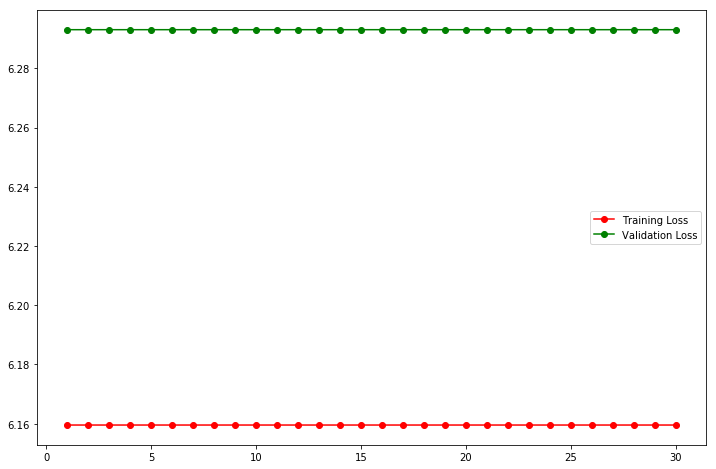

In [0]:
plotErrorGraph(history,30)

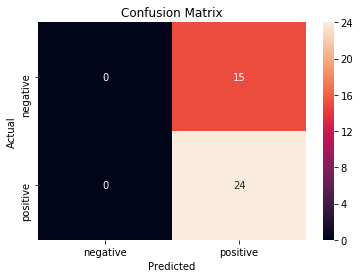

In [0]:
pred = custom_vgg_model.predict(X_test)
plotConfusionMatrix(y_test,pred)

### Observation:

We can see that Model is not learning anything.

### Include top = False

In [0]:
image_input = Input(shape=(224, 224, 3))
vgg_model = vgg16.VGG16(input_tensor=image_input, include_top=False,weights='imagenet')
vgg_model.summary()

58892288/58889256 [==============================] - 1s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
______________________________________________________________

In [0]:
# Freeze the layers except the last 4 layers
for layer in vgg_model.layers[:-4]:
    layer.trainable = False
 
## Check the trainable status of the individual layers
for layer in vgg_model.layers:
    print(layer, layer.trainable)

<keras.engine.input_layer.InputLayer object at 0x7f36f81a15c0> False
<keras.layers.convolutional.Conv2D object at 0x7f36f81a1748> False
<keras.layers.convolutional.Conv2D object at 0x7f36f81b40f0> False
<keras.layers.pooling.MaxPooling2D object at 0x7f36f8152048> False
<keras.layers.convolutional.Conv2D object at 0x7f36f813e940> False
<keras.layers.convolutional.Conv2D object at 0x7f36f81691d0> False
<keras.layers.pooling.MaxPooling2D object at 0x7f36f80fe9e8> False
<keras.layers.convolutional.Conv2D object at 0x7f36f80fee48> False
<keras.layers.convolutional.Conv2D object at 0x7f36f812b5f8> False
<keras.layers.convolutional.Conv2D object at 0x7f36f80c6630> False
<keras.layers.pooling.MaxPooling2D object at 0x7f36f80d7b38> False
<keras.layers.convolutional.Conv2D object at 0x7f36f80f0198> False
<keras.layers.convolutional.Conv2D object at 0x7f36f8089b70> False
<keras.layers.convolutional.Conv2D object at 0x7f36f80a0a90> False
<keras.layers.pooling.MaxPooling2D object at 0x7f36f804d9b0>

In [0]:
# Create the model
model = Sequential()
 
# Add the vgg convolutional base model
model.add(vgg_model)
 
# Add new layers
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1, activation='softmax'))
 
# Show a summary of the model. Check the number of trainable parameters
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_2 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 25088)             0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 25089     
Total params: 14,739,777
Trainable params: 7,104,513
Non-trainable params: 7,635,264
_________________________________________________________________


In [0]:
  # Compile model
  model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

In [0]:
history = model.fit_generator(
    train_generator,
    epochs=12,
    validation_data=validation_generator)

(loss, accuracy) = model.evaluate(X_test, y_test, batch_size=10, verbose=1)

print('Training loss: ')
print("[INFO] loss={:.4f}, accuracy: {:.4f}%".format(loss,accuracy * 100))

Epoch 1/12
6/6 [==============================] - 5s 840ms/step - loss: 6.2890 - acc: 0.6055 - val_loss: 6.2930 - val_acc: 0.6053
Epoch 2/12
6/6 [==============================] - 4s 633ms/step - loss: 6.2890 - acc: 0.6055 - val_loss: 6.2930 - val_acc: 0.6053
Epoch 3/12
6/6 [==============================] - 4s 646ms/step - loss: 6.3601 - acc: 0.6011 - val_loss: 6.2930 - val_acc: 0.6053
Epoch 4/12
6/6 [==============================] - 4s 640ms/step - loss: 6.2178 - acc: 0.6100 - val_loss: 6.2930 - val_acc: 0.6053
Epoch 5/12
6/6 [==============================] - 4s 647ms/step - loss: 6.0754 - acc: 0.6189 - val_loss: 6.2930 - val_acc: 0.6053
Epoch 6/12
6/6 [==============================] - 4s 628ms/step - loss: 6.0043 - acc: 0.6234 - val_loss: 6.2930 - val_acc: 0.6053
Epoch 7/12
6/6 [==============================] - 4s 631ms/step - loss: 6.3601 - acc: 0.6011 - val_loss: 6.2930 - val_acc: 0.6053
Epoch 8/12
6/6 [==============================] - 4s 644ms/step - loss: 6.0043 - acc: 0.62

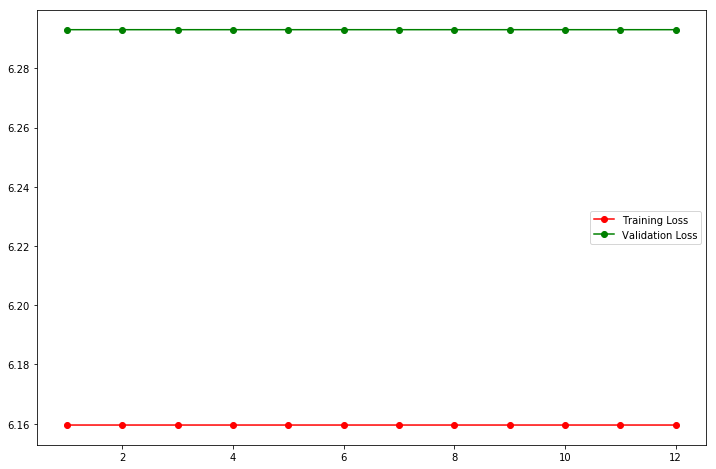

In [0]:
plotErrorGraph(history,12)

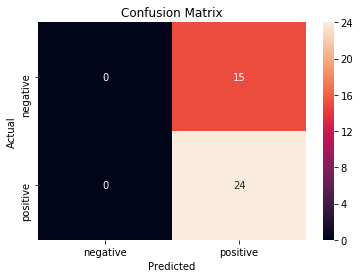

In [0]:
pred = model.predict(X_test)
plotConfusionMatrix(y_test,pred)

In [0]:
image_input = Input(shape=(224, 224, 3))

model = VGG16(input_tensor=image_input, include_top=True,weights='imagenet')

model.summary()

last_layer = model.get_layer('block5_pool').output
x= Flatten(name='flatten')(last_layer)
x = Dense(128, activation='relu', name='fc1')(x)
x = Dense(128, activation='relu', name='fc2')(x)
out = Dense(1, activation='softmax', name='output')(x)
custom_vgg_model2 = Model(image_input, out)
custom_vgg_model2.summary()



553467904/553467096 [==============================] - 81s 0us/step


Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_______________________________________________________

In [0]:
# freeze all the layers except the dense layers
for layer in custom_vgg_model2.layers[:-3]:
	layer.trainable = False

custom_vgg_model2.summary()

custom_vgg_model2.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

t=time.time()
#	t = now()
history = custom_vgg_model2.fit(X_train, y_train, batch_size=32, epochs=12, verbose=1, validation_data=(X_test, y_test))
print('Training time: %s' % ( time.time() -t ))
(loss, accuracy) = custom_vgg_model2.evaluate(X_test, y_test, batch_size=10, verbose=1)

print("[INFO] loss={:.4f}, accuracy: {:.4f}%".format(loss,accuracy * 100))

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

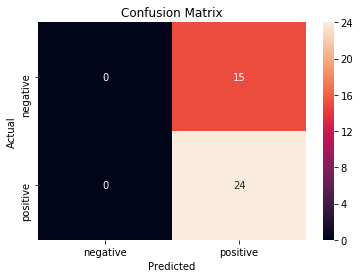

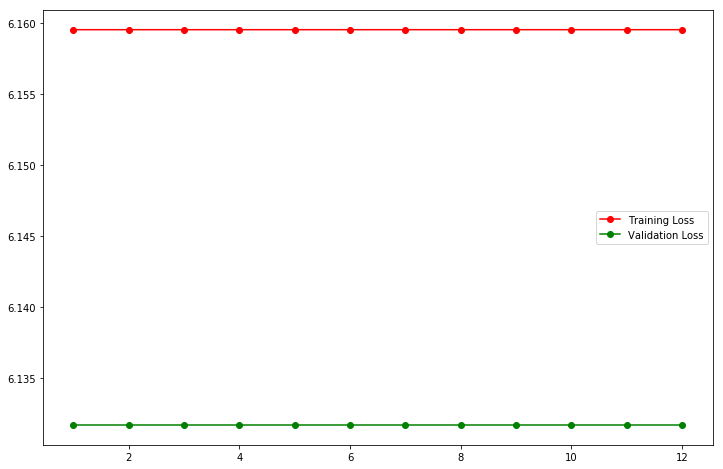

In [0]:
pred = custom_vgg_model2.predict(X_test)
plotConfusionMatrix(y_test,pred)

plotErrorGraph(history,12)

### Observation:

We can see that still Model is not learning anything.

Weigh change

In [0]:
image_input = Input(shape=(224, 224, 3))

weights_path = '/content/drive/My Drive/Transfer Learning/cat dog horse human /train_models/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5'


vgg_model = VGG16(input_tensor=image_input, include_top=False,weights=weights_path)


output_classes = 1

model = Sequential()
model.add(vgg_model)
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(output_classes, activation='sigmoid'))
model.layers[0].trainable = False
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_2 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 25088)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 25089     
Total params: 14,739,777
Trainable params: 25,089
Non-trainable params: 14,714,688
_________________________________________________________________


In [0]:
model.compile(loss='binary_crossentropy', optimizer= keras.optimizers.RMSprop(lr=1e-4) ,metrics=['accuracy'])

t=time.time()
#	t = now()
# history = model.fit(X_train, y_train, batch_size=32, epochs=12, verbose=1, validation_data=(X_test, y_test))
history = model.fit_generator(
    train_generator,
    steps_per_epoch=50,
    epochs=12,
    validation_data=validation_generator,
    validation_steps=25
)
print('Training time: %s' % ( time.time() -t ))
(loss, accuracy) = model.evaluate(X_test, y_test, batch_size=10, verbose=1)

print("[INFO] loss={:.4f}, accuracy: {:.4f}%".format(loss,accuracy * 100))

Epoch 1/12
50/50 [==============================] - 25s 504ms/step - loss: 0.1099 - acc: 0.9669 - val_loss: 0.7364 - val_acc: 0.7500
Epoch 2/12
50/50 [==============================] - 23s 469ms/step - loss: 0.1075 - acc: 0.9656 - val_loss: 0.6861 - val_acc: 0.7687
Epoch 3/12
50/50 [==============================] - 25s 491ms/step - loss: 0.1181 - acc: 0.9613 - val_loss: 0.7025 - val_acc: 0.7484
Epoch 4/12
50/50 [==============================] - 23s 458ms/step - loss: 0.1107 - acc: 0.9575 - val_loss: 0.6835 - val_acc: 0.7781
Epoch 5/12
50/50 [==============================] - 23s 467ms/step - loss: 0.1077 - acc: 0.9668 - val_loss: 0.7345 - val_acc: 0.7406
Epoch 6/12
50/50 [==============================] - 25s 506ms/step - loss: 0.1072 - acc: 0.9663 - val_loss: 0.6705 - val_acc: 0.7710
Epoch 7/12
50/50 [==============================] - 23s 462ms/step - loss: 0.1036 - acc: 0.9688 - val_loss: 0.6881 - val_acc: 0.7719
Epoch 8/12
50/50 [==============================] - 23s 465ms/step - 

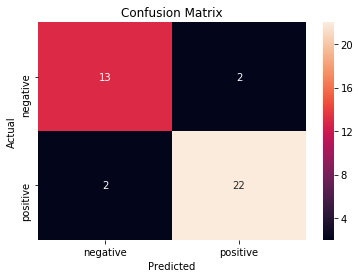

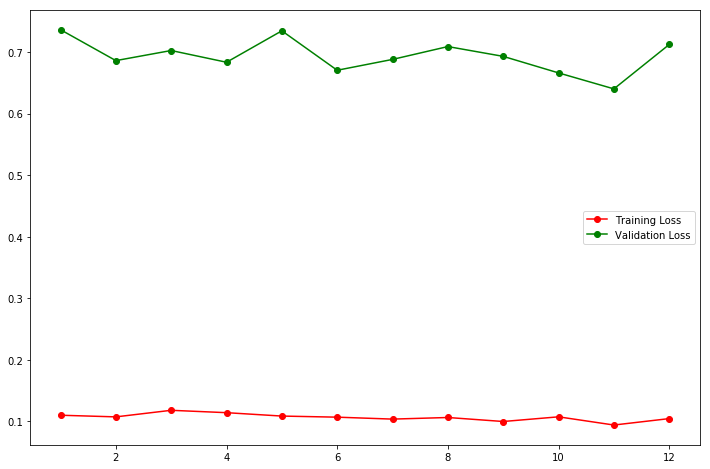

In [0]:
pred = model.predict(X_test)
plotConfusionMatrix(y_test,pred)

plotErrorGraph(history,12)

### Observation:

We can see that now model start learning.
- Test Loss=0.3374
- Test Accuracy: 89.7436%

But there is so much GAP between train loss and validation loss.


## Fine Funing VGG16 model

In above model we tried VGG16 Model and flatten it and add some dropout, which is performing better, but can we improve more?

*Add last dense 512 layer.*

In [0]:
image_input = Input(shape=(224, 224, 3))

weights_path = '/content/drive/My Drive/Transfer Learning/cat dog horse human /train_models/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5'


vgg_model = VGG16(input_tensor=image_input, include_top=False,weights=weights_path)


output_classes = 1

model = Sequential()
model.add(vgg_model)
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.5))

model.add(layers.Dense(output_classes, activation='sigmoid'))
model.layers[0].trainable = False
model.summary()
 







Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 25088)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               12845568  
_________________________________________________________________
dropout_2 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 513       

In [0]:

import keras 

model.compile(loss='binary_crossentropy', optimizer= keras.optimizers.RMSprop(lr=1e-4) ,metrics=['accuracy'])

t=time.time()
#	t = now()
# history = model.fit(X_train, y_train, batch_size=32, epochs=12, verbose=1, validation_data=(X_test, y_test))
history = model.fit_generator(
    train_generator,
    steps_per_epoch=100,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=50
)
print('Training time: %s' % ( time.time() -t ))
(loss, accuracy) = model.evaluate(X_test, y_test, batch_size=10, verbose=1)

print("[INFO] loss={:.4f}, accuracy: {:.4f}%".format(loss,accuracy * 100))


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Epoch 1/20
100/100 [==============================] - 138s 1s/step - loss: 0.6202 - acc: 0.7175 - val_loss: 0.6905 - val_acc: 0.7125
Epoch 2/20
100/100 [==============================] - 68s 683ms/step - loss: 0.4126 - acc: 0.8294 - val_loss: 0.6011 - val_acc: 0.7270
Epoch 3/20
100/100 [==============================] - 68s 679ms/step - loss: 0.3378 - acc: 0.8506 - val_loss: 0.5833 - val_acc: 0.7556
Epoch 4/20
100/100 [==============================] - 66s 659ms/step - loss: 0.2890 - acc: 0.8734 - val_loss: 0.6496 - val_acc: 0.7453
Epoch 5/20
100/100 [==============================] - 68s 683ms/step - loss: 0.2788 - acc: 0.8850 - val_loss: 0.6947 - val_acc: 0.7667
Epoch 6/20
100/100 [==============================] - 68s 681ms/step - loss: 0.2515 - acc: 0.8978 - val_loss: 0.6938 - val_acc: 0.7667
Epoch 7/20
100/100 [==============================] - 66s 663ms/step - loss: 0.2288 - acc: 0.9050

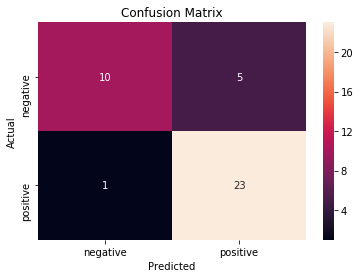

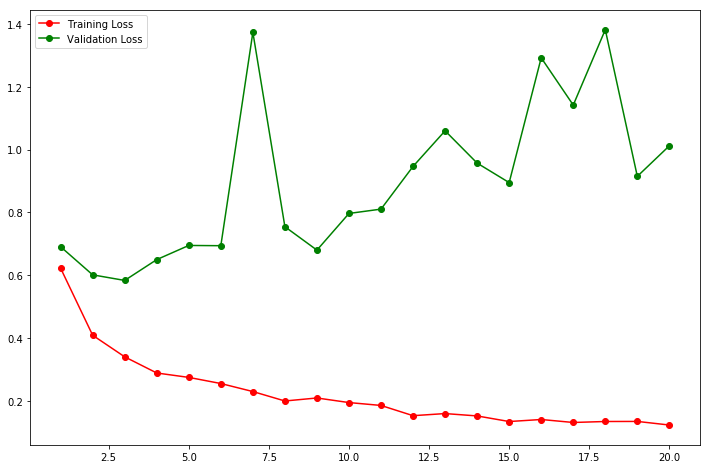

In [0]:
pred = model.predict(X_test)
plotConfusionMatrix(y_test,pred)

plotErrorGraph(history,20)

# TensorBoard

## Fine tunign Result

We have experiement with No dense layer,single Dense layer and Two Dense layer.

Also we experiment below scale.

dense_layers = [1, 2, 3] </br>
layer_sizes = [ 128,256,512,1024]

After experiement it was clear that for our problem, choosing "No Dense layer" is better approach.


VGG16 --> Flatten --> Dropout --- Sigmoid(output)



In [0]:
% tensorboard --logdir=./logs_BTD_VGG_Hyperparam


Reusing TensorBoard on port 6006 (pid 1074), started 0:00:08 ago. (Use '!kill 1074' to kill it.)

## Tuning Optimizer

Lets decide which optimizer we should use, "ADAM" or "RMSProp" with different learning rates.

learning_rate = [1e-5,1e-4,1e-3,1e-2,1e-1]</br>
optimizer = ['Adam', 'RMSProp']

In [0]:
image_input = Input(shape=(224, 224, 3))

weights_path = '/content/drive/My Drive/Transfer Learning/cat dog horse human /train_models/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5'
output_classes = 1

learning_rate = [1e-5,1e-4,1e-3,1e-2,1e-1]
optimizer = ['Adam', 'RMSProp']

for opt in optimizer:
  for lr_ in learning_rate:
    
    print("=="*5,opt,"---",lr_,"=="*5)

    vgg_model = VGG16(input_tensor=image_input, include_top=False,weights=weights_path)

    model = Sequential()
    model.add(vgg_model)
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(output_classes, activation='sigmoid'))
    model.layers[0].trainable = False
    model.summary()
    
    if opt == 'Adam':

      model.compile(loss='binary_crossentropy', optimizer= keras.optimizers.Adam(lr=lr_) ,metrics=['accuracy'])
      
    else:
      model.compile(loss='binary_crossentropy', optimizer= keras.optimizers.RMSprop(lr=lr_) ,metrics=['accuracy'])


    tensorboard = TensorBoard(log_dir= log_dir_weight+'/'+opt+str(lr_))


    history = model.fit(X_train,
              y_train,
              batch_size=batch_size,
              validation_data=(X_val, y_val),
              callbacks= [tensorboard],
              epochs=15)
    score = model.evaluate(X_test, y_test, verbose=0)
    print(model.metrics_names)
    print(score)

    pred = model.predict(X_test)
    plotConfusionMatrix(y_test,pred)


In [0]:
% tensorboard --logdir=./logs_BTD_VGG_Weights

## Fine Tuning Optimizer
After experiment was can be easy conclude that "ADAM" performing better as always.

## Fine Tuning Regularizer

It was observed that there is *TRAIN* loss and *Validation* loss have larger *GAP*. We added Dropout but it was not sufficient so decided to add regularizer.

<br>
<br>

We have tried L1,L2 and L1-L2 Regularizer. 

We have experiment on below values,

reg_rate = [1e-5,1e-4,1e-3,1e-2,1e-1]<br>
regularizer = ['l1_l2','l1', 'l2']


In [0]:
image_input = Input(shape=(224, 224, 3))

weights_path = '/content/drive/My Drive/Transfer Learning/cat dog horse human /train_models/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5'
output_classes = 1

reg_rate = [1e-5,1e-4,1e-3,1e-2,1e-1]
regularizer = ['l1_l2','l1', 'l2']

for reg in regularizer:
  for rr_ in reg_rate:
    
      print("=="*5,reg,"---",rr_,"=="*5)

      vgg_model = VGG16(input_tensor=image_input, include_top=False,weights=weights_path)

      model = Sequential()
      model.add(vgg_model)
      if reg == 'l1': 
        model.get_layer('vgg16').kernel_regularizer = l1(rr_) 
      elif reg == 'l2':
        model.get_layer('vgg16').kernel_regularizer = l2(rr_) 
      else:
        model.get_layer('vgg16').kernel_regularizer = l1_l2(rr_) 
        
      model.add(layers.Flatten())
      model.add(layers.Dropout(0.5))

      model.add(layers.Dense(output_classes, activation='sigmoid'))
      model.layers[0].trainable = False
      model.summary()

      tensorboard = TensorBoard(log_dir= log_dir_regularizer+'/'+reg+' -- '+str(rr_))

      model.compile(loss='binary_crossentropy', optimizer= 'adam' ,metrics=['accuracy'])

      history = model.fit(X_train,
                y_train,
                batch_size=batch_size,
                validation_data=(X_val, y_val),
                callbacks= [tensorboard],
                epochs=25)
      score = model.evaluate(X_test, y_test, verbose=0)
      print(model.metrics_names)
      print(score)

      pred = model.predict(X_test)
      plotConfusionMatrix(y_test,pred)


In [0]:
% tensorboard --logdir=./logs_BTD_VGG_Regularizer

After above experiment it is observed that <br>
L1=0.001<br>
L2 =0.1<br>
L1_L2 = 1e-5<br>

Are perfoming equally likely.

## Final Model

In [18]:
image_input = Input(shape=(224, 224, 3))

log_dir_model = './logs_BTD_Models'
if not exists(log_dir_model):
    makedirs(log_dir_model)

vgg_model = VGG16(input_tensor=image_input, include_top=False)

output_classes = 1

model = Sequential()
model.add(vgg_model)
model.get_layer('vgg16').kernel_regularizer = l1(0.001)
model.add(layers.Flatten())
model.add(layers.Dropout(0.55))

model.add(layers.Dense(output_classes, activation='sigmoid'))
model.layers[0].trainable = False
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_4 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 25088)             0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 25089     
Total params: 14,739,777
Trainable params: 25,089
Non-trainable params: 14,714,688
_________________________________________________________________


In [19]:
model.compile(loss='binary_crossentropy', optimizer= 'adam' ,metrics=['accuracy'])

earlyStop = EarlyStopping(monitor='val_loss',mode='min', patience=5)

tensorboard = TensorBoard(log_dir= log_dir_model+'/1',histogram_freq=0)


# tensorboard = TensorBoard(log_dir= log_dir_model+'/0',
#                           batch_size=16,histogram_freq=1,
#                           embeddings_freq=1,
#                           embeddings_layer_names=['binary_output'],
#                           embeddings_metadata='metadata.tsv',
#                           embeddings_data=X_test)

# mcp_save = ModelCheckpoint('.model_wts.hdf5', save_best_only=True, monitor='val_loss', mode='min')

# history = model.fit_generator(
#     train_generator,
#     steps_per_epoch=50,
#     epochs=12,
#     validation_data=validation_generator,
#     validation_steps=25
# )

history = model.fit(X_train,
          y_train,
          batch_size=16,
          validation_data=(X_val, y_val),
          callbacks= [ tensorboard],
          epochs=15)


Train on 176 samples, validate on 38 samples
Epoch 1/15
176/176 [==============================] - 2s 14ms/step - loss: 0.6593 - acc: 0.6705 - val_loss: 0.7537 - val_acc: 0.5789
Epoch 2/15
176/176 [==============================] - 2s 12ms/step - loss: 0.3869 - acc: 0.8068 - val_loss: 0.6517 - val_acc: 0.6053
Epoch 3/15
176/176 [==============================] - 2s 12ms/step - loss: 0.2888 - acc: 0.9034 - val_loss: 0.6689 - val_acc: 0.6579
Epoch 4/15
176/176 [==============================] - 2s 12ms/step - loss: 0.2231 - acc: 0.9261 - val_loss: 0.8411 - val_acc: 0.6842
Epoch 5/15
176/176 [==============================] - 2s 12ms/step - loss: 0.1858 - acc: 0.9205 - val_loss: 0.6670 - val_acc: 0.7368
Epoch 6/15
176/176 [==============================] - 2s 12ms/step - loss: 0.1447 - acc: 0.9545 - val_loss: 0.6186 - val_acc: 0.7368
Epoch 7/15
176/176 [==============================] - 2s 12ms/step - loss: 0.1041 - acc: 0.9773 - val_loss: 0.6857 - val_acc: 0.6842
Epoch 8/15
176/176 [====

39/39 [==============================] - 1s 16ms/step
[INFO] loss=0.3388, accuracy: 89.7436%


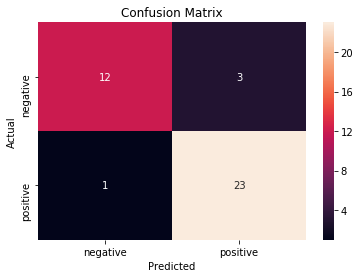

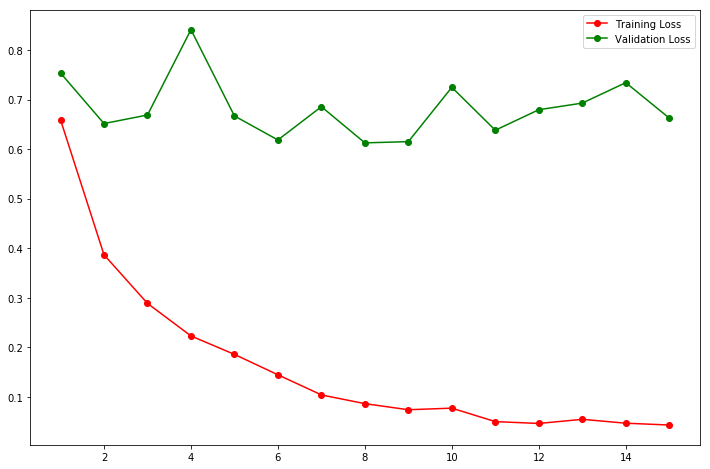

In [27]:
(loss, accuracy) = model.evaluate(X_test, y_test, batch_size=10, verbose=1)

print("[INFO] loss={:.4f}, accuracy: {:.4f}%".format(loss,accuracy * 100))

pred = model.predict(X_test)
plotConfusionMatrix(y_test,pred)

plotErrorGraph(history,15   )

#Result

Till now we have tried so many models. But loss is not reducing under 0.30. SO we are stoping here.

Frankly this is also better model.

Loss = 0.33<br>
Accuracy = 90%(approx)

False Negative Rate is small = 1/24 = 0.04 </br>
False Positive Rate is also = 3/15 = 0.2

In our problem FNR should be minimal. which is achieved.

# Summary
As we know dataset is very small so we decided to used CNN architecture, try to build architecture from scratch. It was quite effective, but model was heavily overfitting.
<br><br>

So we move towards "*Transfer Learning*" using **VGG16**. We dataset is smaller is was bit challanger to overcome *OVERFITTING*.
<br>
We fine tune network, like choosing Learning rate, choose optimizer, choose architecture wheather add last dense layer or not. Also we used some regularizers, then network start learning.


So final words, **Tuning the network is key thing**.




# Future scope

Still we can improve model, using different pretrained models like ResNet50,Inception model also R-CNN could work better.

## Reference

Transfer Learning:

- https://www.learnopencv.com/keras-tutorial-fine-tuning-using-pre-trained-models/

- https://github.com/anujshah1003/Transfer-Learning-in-keras---custom-data/blob/master/transfer_learning_vgg16_custom_data.py#L25
- https://www.youtube.com/watch?v=L7qjQu2ry2Q&t=702s

<br>

Tensor Board:
- https://www.youtube.com/watch?v=xM8sO33x_OU&t=310s
- https://www.youtube.com/watch?v=eBbEDRsCmv4&t=147s
- https://www.youtube.com/watch?v=BqgTU7_cBnk